# Subsetting and Reclustering the Immune Cells

In [3]:
import custom_functions_scviEnv as cf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scipy as scipy
import scvi
import seaborn as sns
import warnings
from custom_functions_scviEnv import plot_marker_genes_group, plot_marker_genes

sc.set_figure_params(scanpy=True, dpi=80, dpi_save=150, frameon=True, vector_friendly=True, 
                     fontsize=14, figsize=None, color_map=None, format='png', facecolor=None, 
                     transparent=False, ipython_format='png2x')

/mnt/home/terrianl/anaconda3/envs/scanpyEnv/lib/python3.11/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/mnt/home/terrianl/anaconda3/envs/scanpyEnv/lib/python3.11/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (


In [4]:
warnings.filterwarnings("ignore")

## Import Data

In [5]:
### Importing data prior to highly variable gene selection so we have the full gene set.
adata_all = sc.read_h5ad("../data/taPVAT_8W_24W_M_F_HF_CTRL_combined_preprocessed.h5ad")

In [6]:
### For adding celltype annotations and UMAP coordinates to adata_all
annotate = sc.read_h5ad('../data/taPVAT_combined_annotated.h5ad')

In [7]:
adata_all

AnnData object with n_obs × n_vars = 71813 × 20743
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    layers: 'counts', 'raw_counts', 'soupX_counts'

In [8]:
### We must normalize and log transform the data in adata_all
sc.pp.normalize_total(adata_all, target_sum=1e4)
sc.pp.log1p(adata_all)
adata_all.raw = adata_all

In [9]:
### Then we add annotations, clusters, and UMAP coordinates
adata_all.obs['celltype'] = annotate.obs.celltype.copy() 
adata_all.obs['celltype_broad'] = annotate.obs.celltype_broad.copy() 
adata_all.obs['leiden'] = annotate.obs.leiden.copy()
adata_all.obsm['X_umap'] = annotate.obsm['X_umap'].copy()

Ptprc


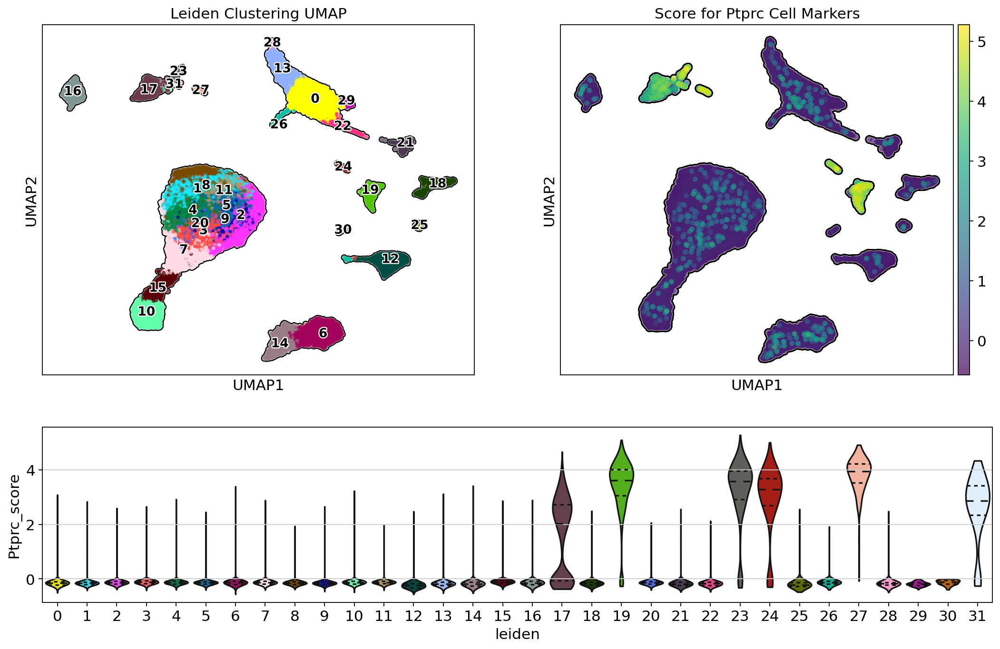

In [11]:
mgl = ['Ptprc']
plot_marker_genes(adata_all, mgl, output_path = "../output/immune_subset/taPVAT_Immune_Cells_UMAP_violin_plot_for_")

In [98]:
### Subsetting so that adata only includes immune cells
adata = adata_all[(adata_all.obs['celltype_broad'].isin(['Immune_Cells']))].copy()

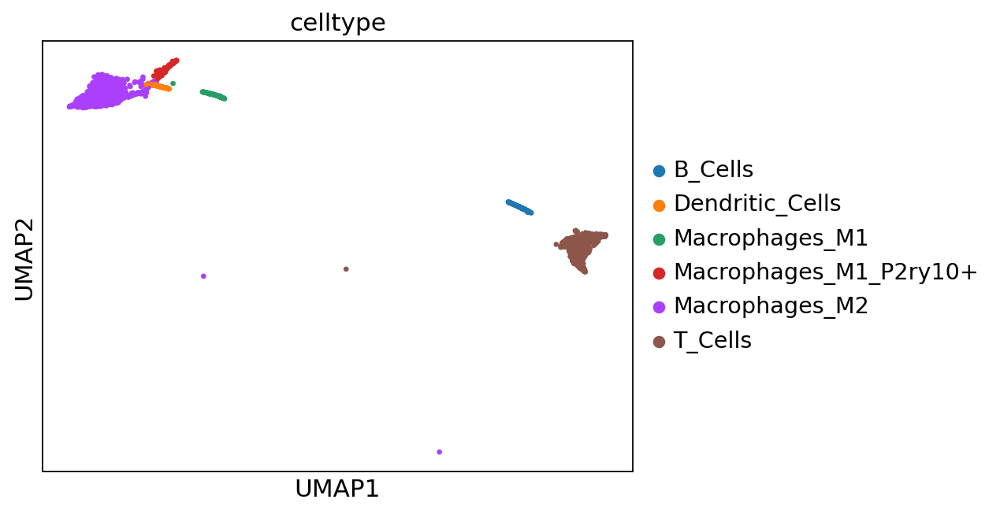

In [99]:
sc.pl.umap(adata, color = 'celltype')

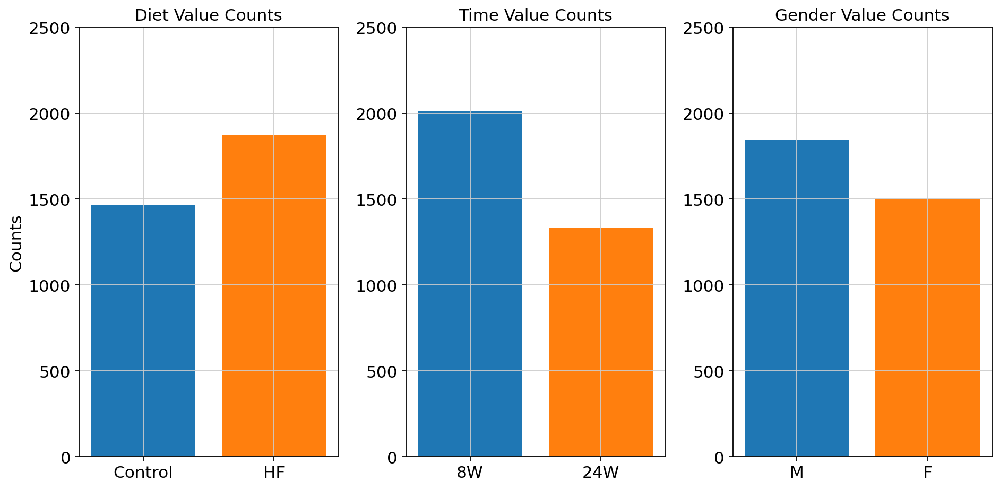

In [100]:
fig = plt.figure(figsize = (12,6))

gs = fig.add_gridspec(ncols=3, nrows=1)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])

value_counts = adata.obs.diet.value_counts()
value_counts = value_counts.reindex(['Control', 'HF'])
ax1.bar(value_counts.index, value_counts.values, color = ['C0', 'C1'])
ax1.set_title('Diet Value Counts')
ax1.set_ylabel('Counts')
ax1.set_ylim(0, 2500)

value_counts = adata.obs.time.value_counts()
value_counts = value_counts.reindex(['8W', '24W'])
ax2.bar(value_counts.index, value_counts.values, color = ['C0', 'C1'])
ax2.set_title('Time Value Counts')
ax2.set_ylim(0, 2500)

value_counts = adata.obs.sex.value_counts()
ax3.bar(value_counts.index, value_counts.values, color = ['C0', 'C1'])
ax3.set_title('Gender Value Counts')
ax3.set_ylim(0, 2500)

plt.tight_layout()
plt.show()

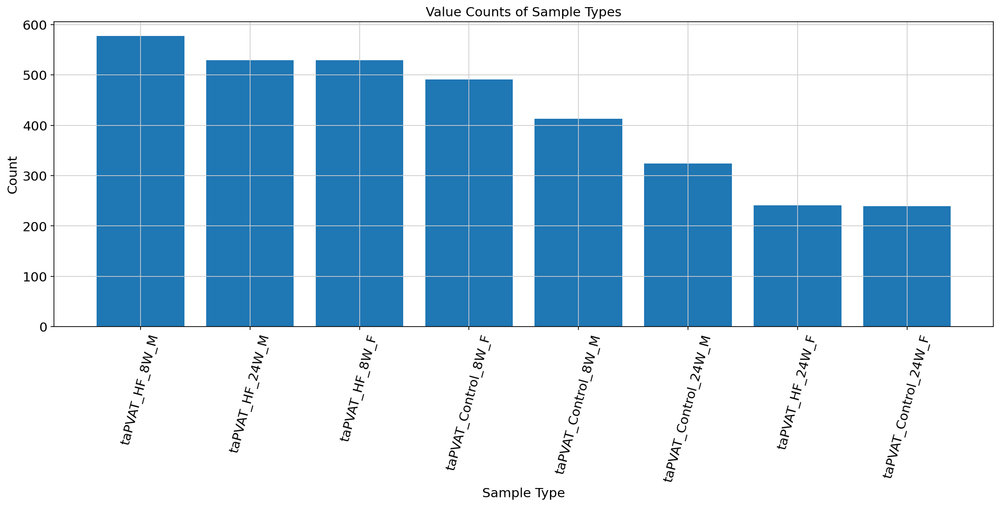

In [101]:
fig, ax = plt.subplots(ncols = 1, figsize = (18,6))

value_counts = adata.obs.sample_type.value_counts()

# Create a bar chart
plt.bar(value_counts.index, value_counts.values)
plt.xticks(rotation=75)

# Add labels and title
plt.xlabel('Sample Type')
plt.ylabel('Count')
plt.title('Value Counts of Sample Types')

# Show the plot
plt.show()

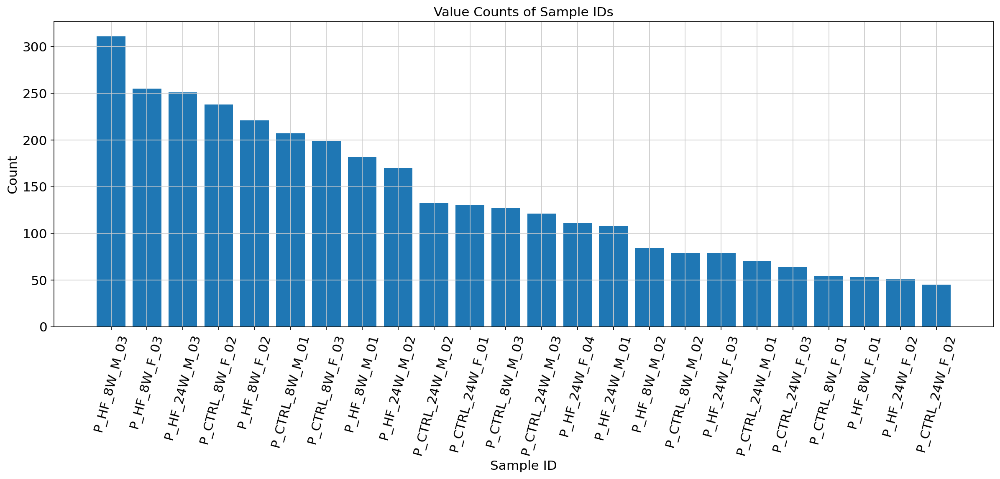

In [102]:
fig, ax = plt.subplots(ncols = 1, figsize = (18,6))

value_counts = adata.obs.sample_id.value_counts()

# Create a bar chart
plt.bar(value_counts.index, value_counts.values)
plt.xticks(rotation=75)

# Add labels and title
plt.xlabel('Sample ID')
plt.ylabel('Count')
plt.title('Value Counts of Sample IDs')

# Show the plot
plt.show()

## Recalculating UMAP with only Immune Cell data

In [103]:
sc.tl.pca(adata)
sc.pp.neighbors(adata, random_state = 0)
sc.tl.umap(adata, min_dist = 0.2)

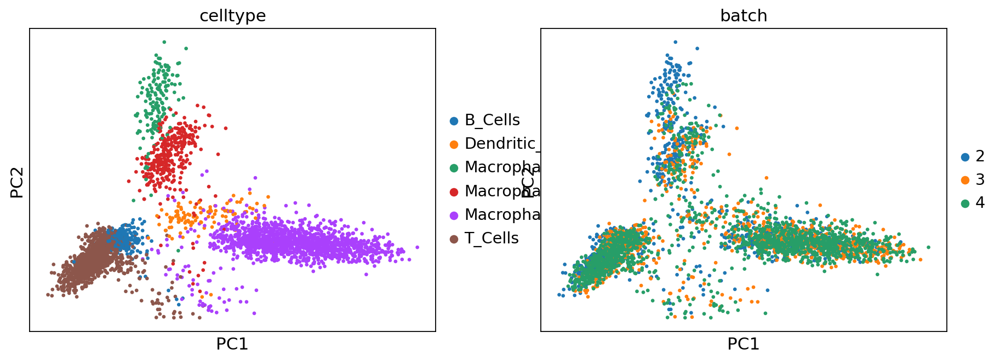

In [104]:
sc.pl.pca(adata, color = ["celltype", "batch"])

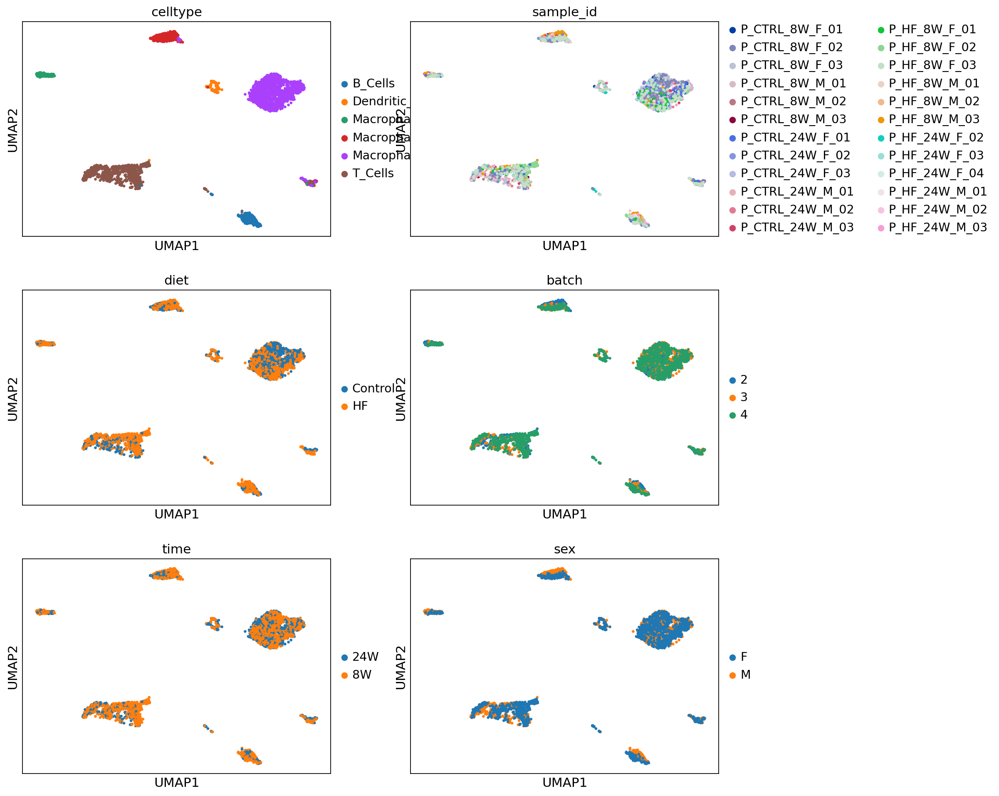

In [105]:
### Checking for sample integration
sc.pl.umap(adata, color = ['celltype', 'sample_id', 'diet', 'batch', 'time', 'sex',], ncols = 2)

## Batch integration with scVI

In [106]:
scvi.settings.seed = 0

[rank: 0] Global seed set to 0


In [107]:
### Setting up the model
scvi.model.SCVI.setup_anndata(
    adata,
    layer="counts",
    categorical_covariate_keys=["Sample"],
    continuous_covariate_keys=["pct_counts_mt", "pct_counts_ribo", "total_counts"]
)

In [108]:
model = scvi.model.SCVI(adata, n_layers=2, n_latent=30, gene_likelihood="nb")

In [67]:
#model.train()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 400/400: 100%|██████████| 400/400 [00:40<00:00,  9.74it/s, v_num=1, train_loss_step=2.22e+3, train_loss_epoch=2.21e+3]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:40<00:00,  9.78it/s, v_num=1, train_loss_step=2.22e+3, train_loss_epoch=2.21e+3]


In [109]:
#####Saving the model
#model.save('./models/taPVAT_immune_8W_24W_M_F_HF_CTRL_combined_model_v1')
#####How to reload model:
model = scvi.model.SCVI.load('./models/taPVAT_immune_8W_24W_M_F_HF_CTRL_combined_model_v1', adata=adata, use_gpu=True)

INFO     File ./models/taPVAT_immune_8W_24W_M_F_HF_CTRL_combined_model_v1/model.pt already downloaded              


In [110]:
latent = model.get_latent_representation()
latent.shape

(3343, 30)

In [111]:
adata.obsm["X_scVI_immune"] = latent
adata.layers["scvi_normalized_immune"] = model.get_normalized_expression(library_size=1e4)

## Running PCA and UMAP on the integrated immune cell subset

In [112]:
sc.tl.pca(adata)
sc.pp.neighbors(adata, random_state = 0, use_rep = 'X_scVI_immune')
sc.tl.umap(adata, min_dist = 0.2)
adata.obsm['X_umap_og'] = adata.obsm['X_umap'].copy()

In [113]:
sc.tl.leiden(adata, use_weights= True, resolution = 2, key_added = 'leiden_sub')

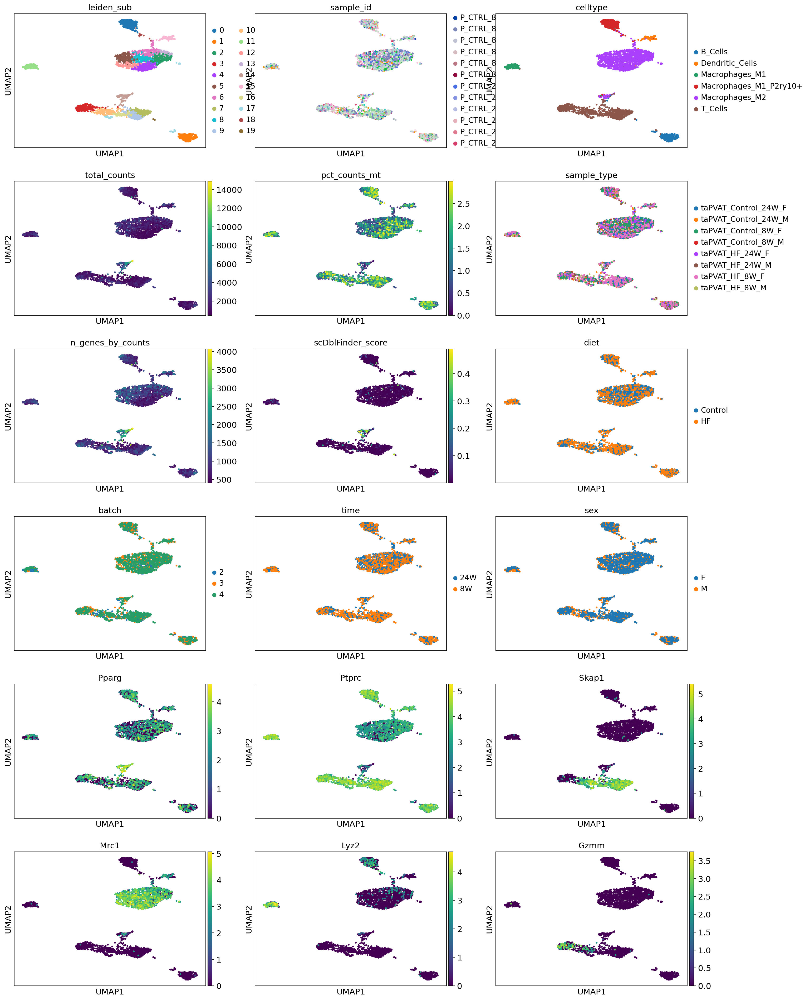

In [115]:
### Samples seem to integrate pretty well now
sc.pl.umap(adata, color = ['leiden_sub', 'sample_id', 'celltype', 'total_counts', 'pct_counts_mt', 'sample_type',
                           'n_genes_by_counts', 'scDblFinder_score', 'diet', 'batch', 'time', 'sex',
                           'Pparg', 'Ptprc','Skap1', 'Mrc1', 'Lyz2', 'Gzmm'], ncols = 3)

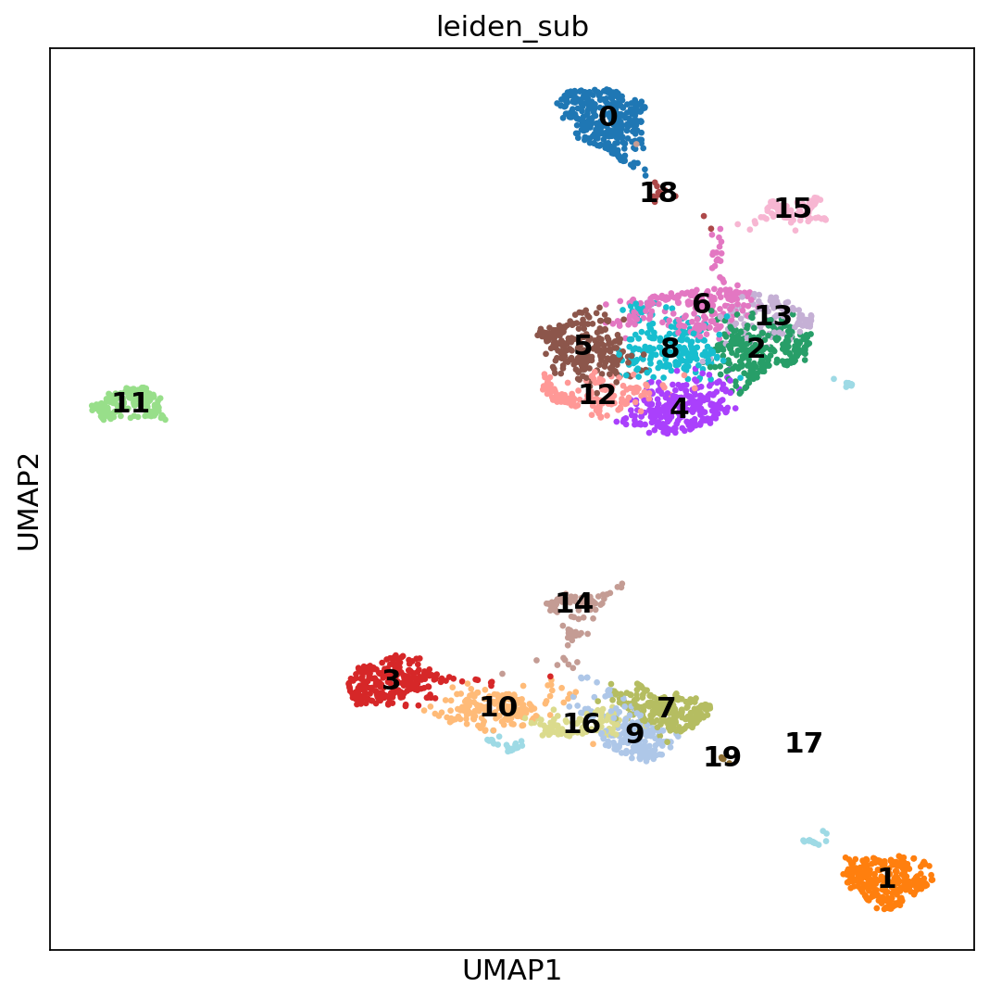

In [116]:
fig, ax = plt.subplots(figsize = (8,8))
sc.pl.umap(adata, color = ['leiden_sub'], ax = ax, legend_loc = 'on data')

<Axes: xlabel='leiden_sub'>

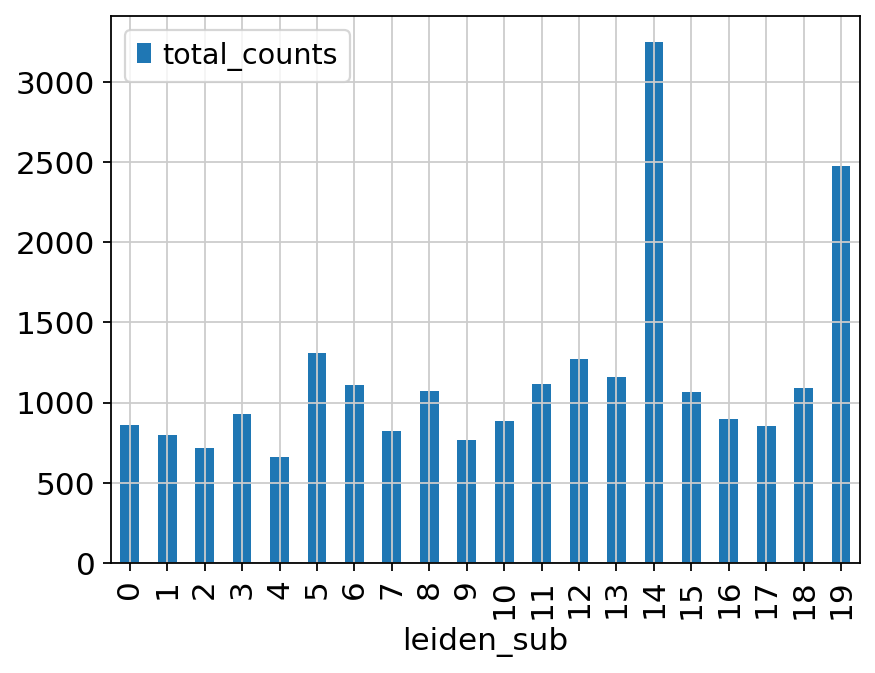

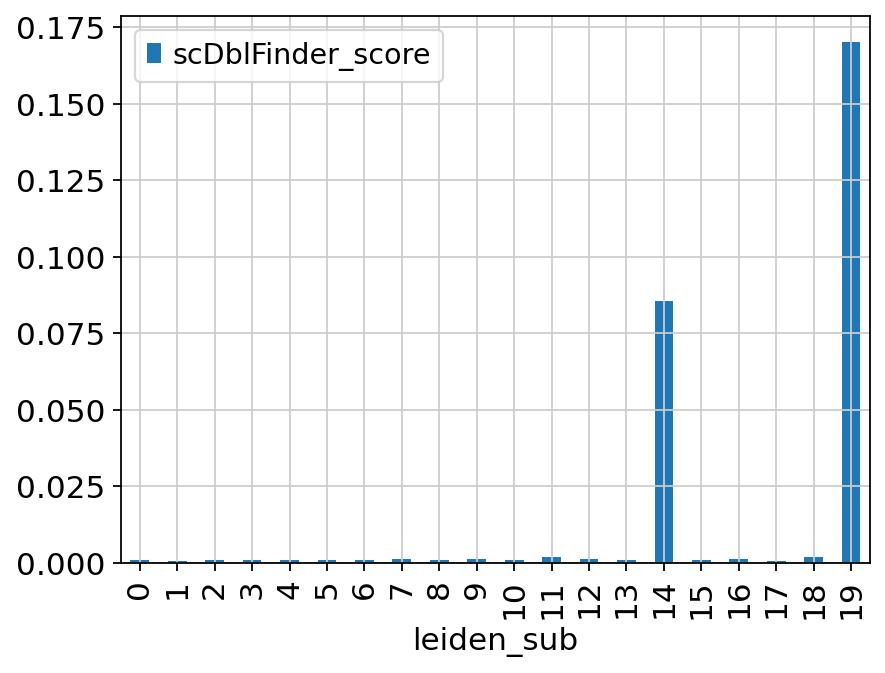

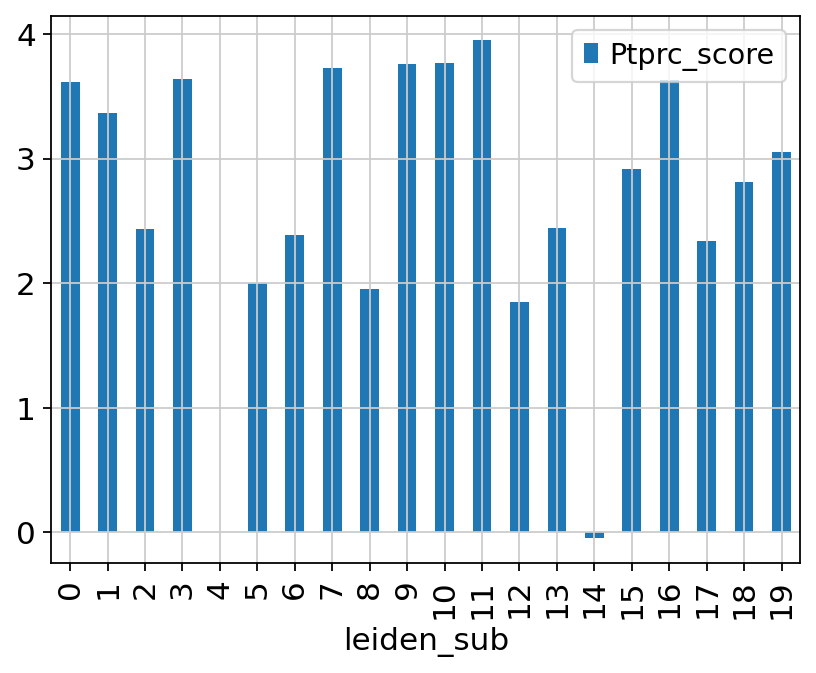

In [117]:
adata.obs.groupby('leiden_sub').median().plot.bar(y = 'total_counts')
adata.obs.groupby('leiden_sub').median().plot.bar(y = 'scDblFinder_score')
adata.obs.groupby('leiden_sub').median().plot.bar(y = 'Ptprc_score')

## Celltypist Labeling

In [129]:
import celltypist
from celltypist import models

In [130]:
# Enabling `force_update = True` will overwrite existing (old) models.
# models.download_models(force_update = True)

In [131]:
# The `model` argument defaults to `Immune_All_Low.pkl`.
model = models.Model.load(model = 'Immune_All_Low.pkl')
model.convert()

🧬 Number of genes in the original model: 6639
✅ Conversion done! Number of genes in the converted model: 4760


In [132]:
model.cell_types

array(['Age-associated B cells', 'Alveolar macrophages', 'B cells',
       'CD16+ NK cells', 'CD16- NK cells', 'CD8a/a', 'CD8a/b(entry)',
       'CMP', 'CRTAM+ gamma-delta T cells', 'Classical monocytes',
       'Cycling B cells', 'Cycling DCs', 'Cycling NK cells',
       'Cycling T cells', 'Cycling gamma-delta T cells',
       'Cycling monocytes', 'DC', 'DC precursor', 'DC1', 'DC2', 'DC3',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ELP',
       'ETP', 'Early MK', 'Early erythroid', 'Early lymphoid/T lymphoid',
       'Endothelial cells', 'Epithelial cells', 'Erythrocytes',
       'Erythrophagocytic macrophages', 'Fibroblasts',
       'Follicular B cells', 'Follicular helper T cells', 'GMP',
       'Germinal center B cells', 'Granulocytes', 'HSC/MPP',
       'Hofbauer cells', 'ILC', 'ILC precursor', 'ILC1', 'ILC2', 'ILC3',
       'Intermediate macrophages', 'Intestinal macrophages',
       'Kidney-resident macrophages', 'Kupffer cells',
       'Large pre-B cell

In [133]:
# Alternatively, just specify the model name (recommended as this ensures the model is intact every time it is loaded).
predictions = celltypist.annotate(adata, model = model, majority_voting = True)

🔬 Input data has 3343 cells and 20743 genes
🔗 Matching reference genes in the model
🧬 4374 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5
🗳️ Majority voting the predictions
✅ Majority voting done!


In [134]:
# Get an `AnnData` with predicted labels embedded into the cell metadata columns.
adata_cell = predictions.to_adata()

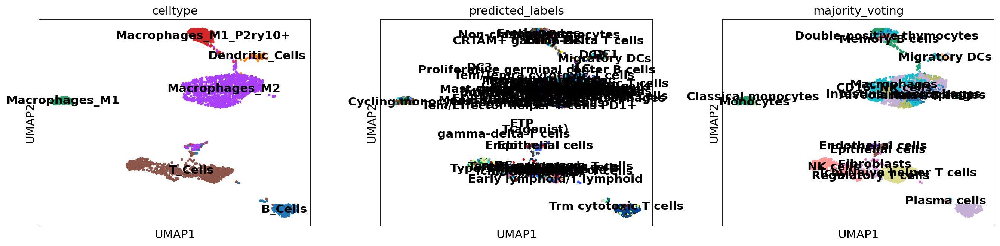

In [135]:
sc.pl.umap(adata_cell, color = ['celltype', 'predicted_labels', 'majority_voting'], legend_loc = 'on data')

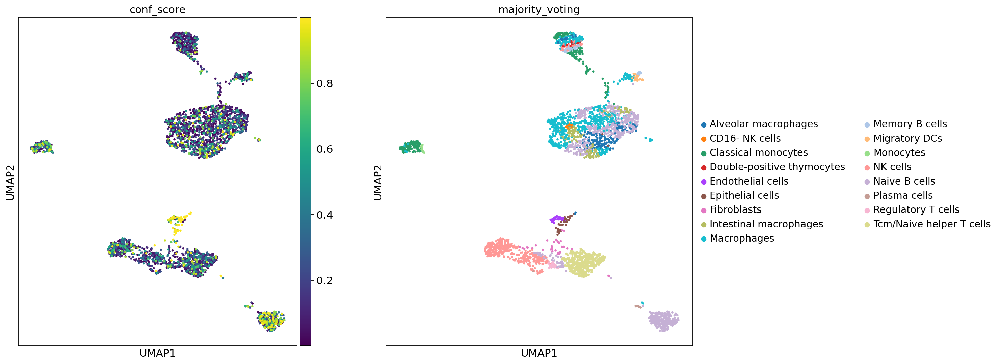

In [136]:
fig = plt.figure(figsize = (16,8))

gs = fig.add_gridspec(ncols=2, nrows=1)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])

sc.pl.umap(adata_cell, color = ['conf_score'], ax = ax1, show = False)
sc.pl.umap(adata_cell, color = ['majority_voting'], ax = ax2, show = False)
plt.show()

In [137]:
adata.obs.majority_voting.value_counts()

Naive B cells                 819
Macrophages                   703
NK cells                      445
Tcm/Naive helper T cells      428
Classical monocytes           260
Alveolar macrophages          200
Intestinal macrophages        162
Memory B cells                 62
Epithelial cells               53
Endothelial cells              41
Fibroblasts                    41
Migratory DCs                  33
Regulatory T cells             28
Double-positive thymocytes     20
Monocytes                      18
CD16- NK cells                 17
Plasma cells                   13
Name: majority_voting, dtype: int64

## Running rank_genes_groups to find DEGs by leiden_sub clusters

In [66]:
## Need to run this to get rank_genes_groups to work
adata.uns['log1p']["base"] = None

In [67]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden_sub', method='wilcoxon', use_raw = True, tie_correct = True, pts = True)

In [68]:
sc.tl.dendrogram(adata, groupby = 'leiden_sub')

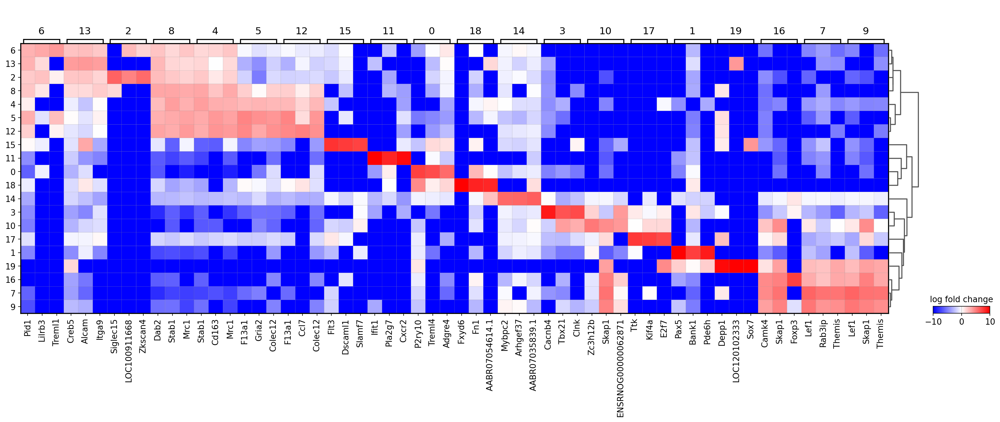

In [69]:
sc.pl.rank_genes_groups_matrixplot(
    adata,
    n_genes=3,
    values_to_plot="logfoldchanges",
    cmap='bwr',
    vmin=-10,
    vmax=10,
    min_logfoldchange=3,
    colorbar_title='log fold change'
)

In [70]:
#sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)
#pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(25)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(100).to_csv('../output/taPVAT_Immune_Cells_8W_24W_HF_CTRL_M_F_rank_genes_groups_top_100_leiden_sub.csv')

## Manually annotating cell types with marker genes

In [71]:
df = pd.read_csv('../output/taPVAT_Immune_Cells_8W_24W_HF_CTRL_M_F_rank_genes_groups_top_100_leiden_sub.csv')
df.drop(df.columns[0], axis=1, inplace = True)
df.head(10)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,P2ry10,Pax5,Dab2,Cacnb4,Stab1,F13a1,Pid1,Lef1,Dab2,Lef1,Zc3h12b,Ifit1,F13a1,Creb5,Mybpc2,Flt3,Camk4,Ttk,Fxyd6,Depp1
1,Treml4,Bank1,Plxnd1,Tbx21,Cd163,Gria2,Tanc2,Rab3ip,Stab1,Skap1,Skap1,Pla2g7,Ccl7,Alcam,Arhgef37,Dscaml1,Skap1,Kif4a,Fn1,LOC120102333
2,Adgre4,Pde6h,Alcam,Clnk,Mrc1,Colec12,P2ry12,Themis,Mrc1,Themis,ENSRNOG00000062871,Cxcr2,Colec12,Itga9,AABR07035839.1,Slamf7,Foxp3,E2f7,AABR07054614.1,Sox7
3,Slfn4,Bcl11a,Rapgef5,Ccl5,Kcnt2,Kcnt2,Arhgap22,Skap1,Rapgef5,Bcl11b,St6galnac3,S100a9,Egr1,Trpc6,Ankef1,Dok6,Bcl11b,Cenpf,Selp,Cxcl12
4,Lilrb4,Btla,Adap2,Gzmk,Selenop,Cd163,Plekha5,Tcf7,Rbpj,Tcf7,Klri1,Nlrp12,Cd163,Zfhx3,Prdm16,Hrh2,Tcf7,Espl1,Capn12,Emcn
5,Samhd1,AABR07060872.1,Ppp2r2b,Adamts14,Psd3,AABR07002969.1,Adap2,ENSRNOG00000063101,Slc9a9,Rab3ip,Tbx21,Il1b,Entrep2,Arhgap22,Zfp423,Zfp366,Itk,Ckap2l,Gprc5a,Dipk2b
6,Abi3,Bach2,Pid1,Rarb,F13a1,Psd3,Zfhx3,Satb1,Slco2b1,Grap2,Srgap3,Clec4d,Ccl2,Soga1,Cgnl1,Ciita,Il2ra,Top2a,ENSRNOG00000069226,Endou
7,Mal,Cmahp,Rbpj,Klri1,Colec12,Negr1,Alcam,Camk4,Frmd4b,Camk4,Il2rb,Ifit1bl,ENSRNOG00000063499,Tanc2,Amotl2,Gpr39,Tox,Cntn1,Rpl21,Btbd18
8,Itgal,Lax1,Slco2b1,Prf1,Rbpj,Adam23,Cfh,Grap2,Snx24,ENSRNOG00000063101,Ctsw,Csf3r,Kcnt2,Ccl12,Tspan18,RT1-Ba,AABR07017902.1,Ankle1,Hoxd3,Cacng1
9,Slc11a1,Cd79a,Stab1,Srgap3,Dab2,Rbpj,RT1-Db1,Bcl11b,AABR07002969.1,St8sia1,Chn2,Nudt4,Selenop,Hip1,Col7a1,Adgrg5,Tnik,Ect2,ENSRNOG00000062391,ENSRNOG00000065225


In [72]:
### Gather a list of the top three DEGs in each cluster
first_three_elements = []
for col_name, col_data in df.iteritems():
    first_three_elements.extend(col_data.iloc[0:3].tolist())

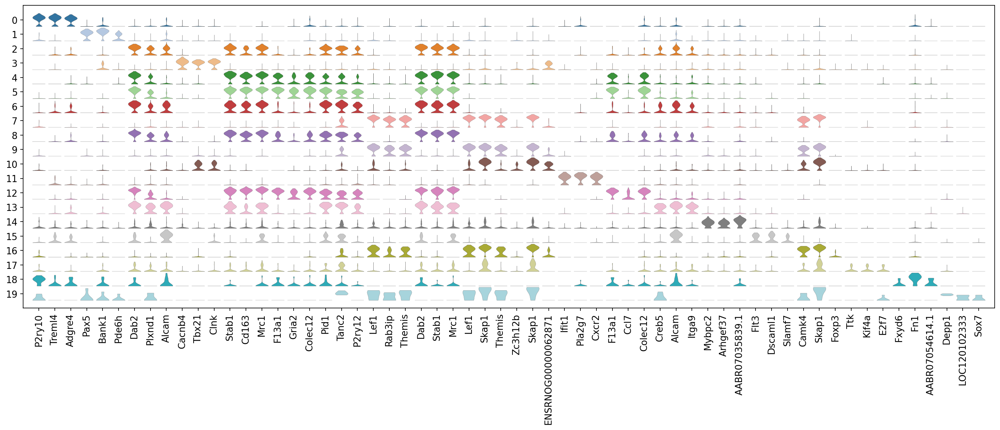

In [73]:
mgl = first_three_elements

ax = sc.pl.stacked_violin(adata, 
                          mgl, 
                          use_raw = True,
                          groupby='leiden_sub', 
                          swap_axes = False,
                          row_palette = 'tab20')

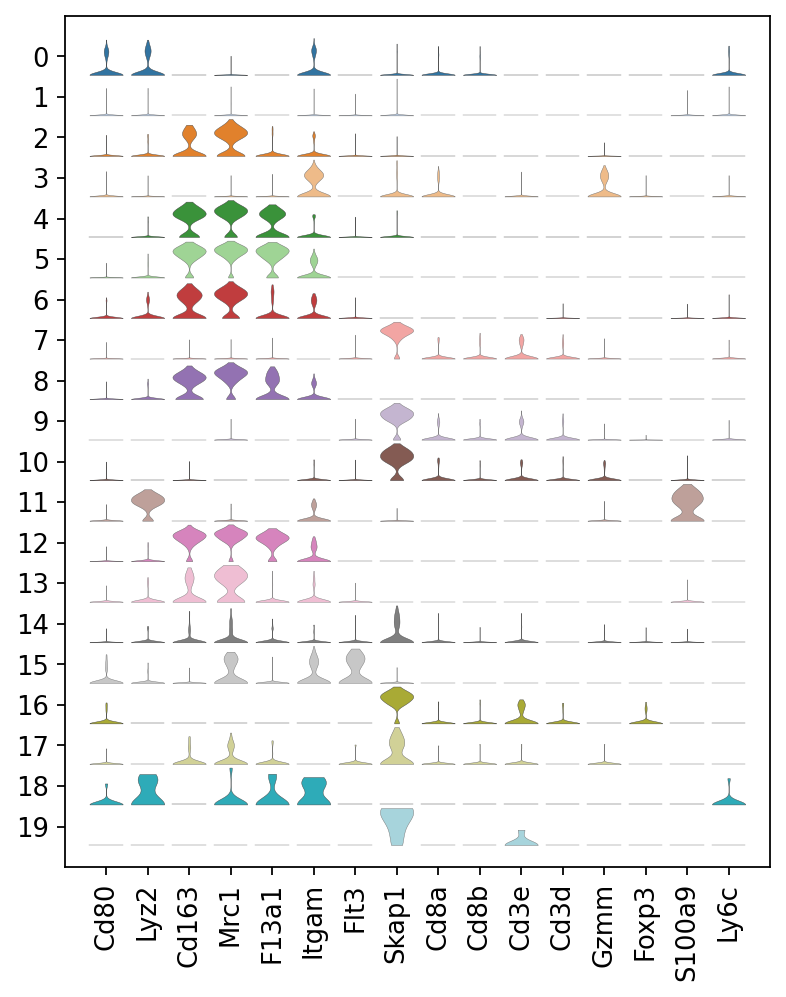

In [138]:
mgl = ['Cd80',
       'Lyz2',
       'Cd163',
       'Mrc1',
       'F13a1',
       'Itgam',
       'Flt3',
       'Skap1',
       'Cd8a',
       'Cd8b',
       'Cd3e',
       'Cd3d',
       'Gzmm',
       'Foxp3',
       'S100a9',
       'Ly6c'
]

ax = sc.pl.stacked_violin(adata, 
                          mgl, 
                          use_raw = True,
                          groupby='leiden_sub', 
                          swap_axes = False,
                          row_palette = 'tab20')

Cd8a


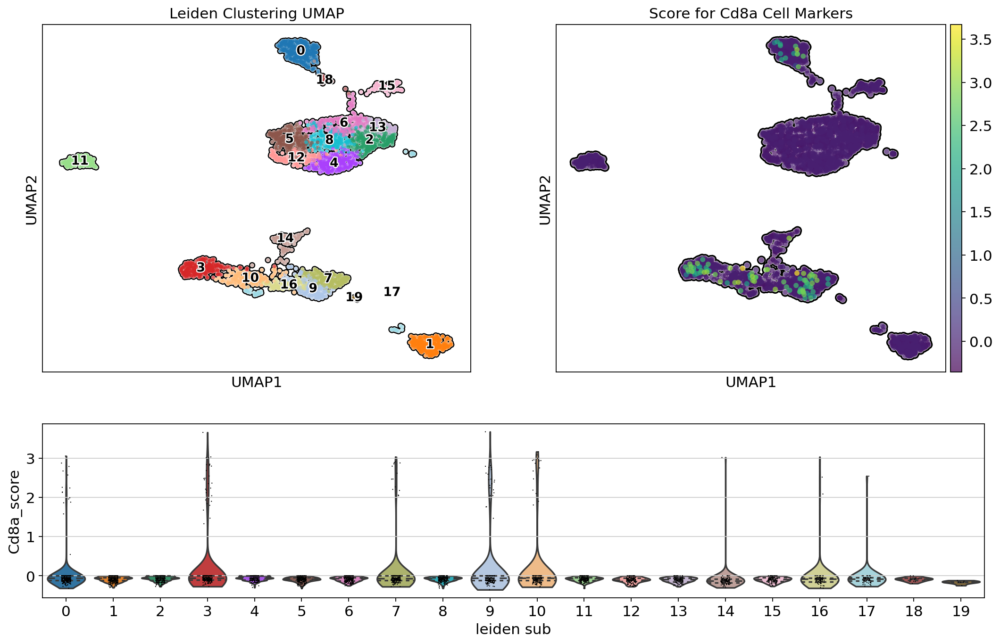

Cd8b


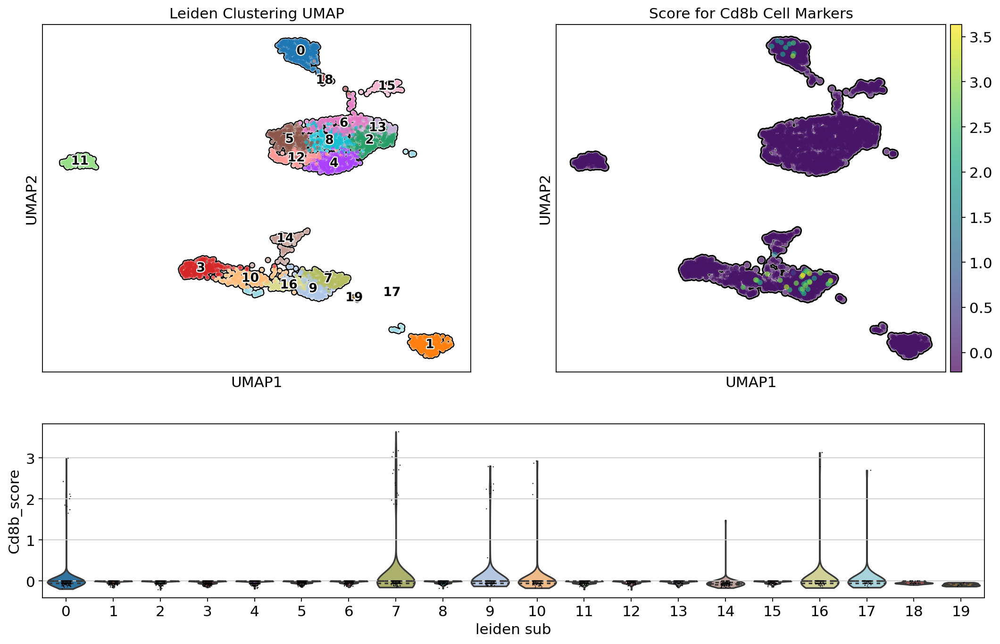

Nkg7


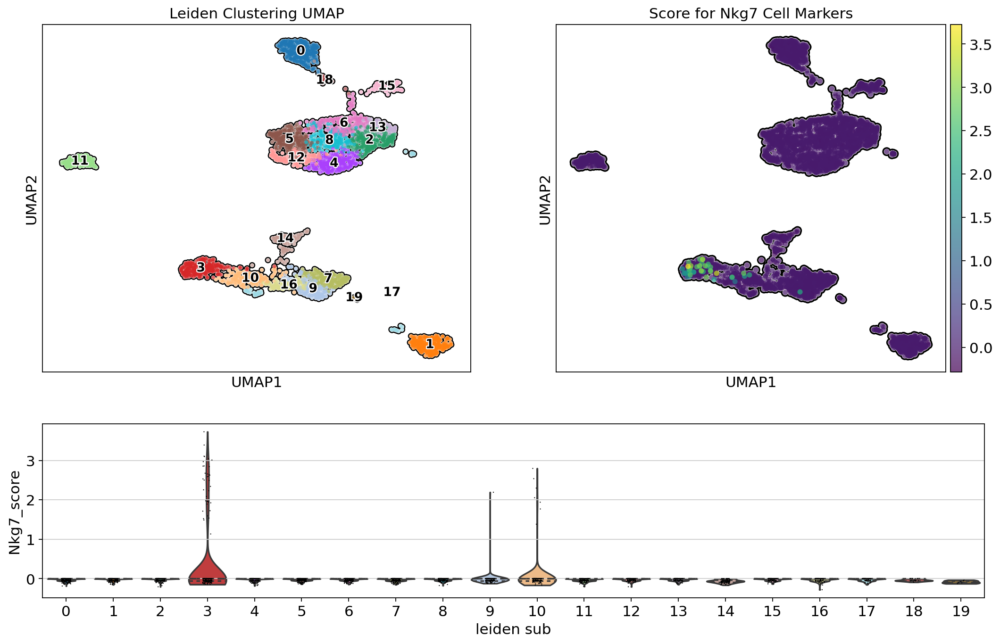

Il32
Il32 is not in the dataset


In [113]:
### Plotting other genes of interest
mgl = ['Cd8a', 'Cd8b']
plot_marker_genes(adata, mgl, group = 'leiden_sub', output_path = "../output/immune_subset/taPVAT_Immune_Cells_UMAP_violin_plot_for_")

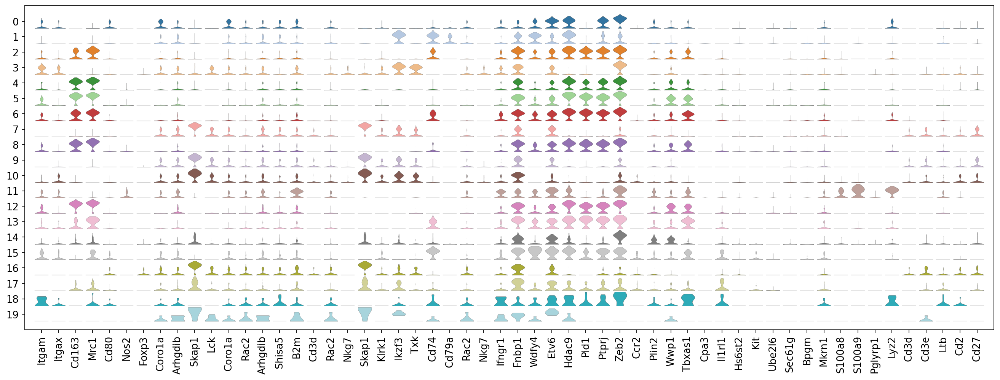

In [74]:
### Top three marker genes from cellxgene cell guide

mgl = ['Itgam', 'Itgax', 'Cd163', 'Mrc1', 'Cd80','Nos2', 'Foxp3',
       'Coro1a', 'Arhgdib',    #Lymphocyte
       'Skap1','Lck',        #T-Cell
       'Coro1a', 'Rac2', 'Arhgdib', 'Shisa5', 'B2m', #Cd4+ T Cell
       'Cd3d', 'Rac2', 'Nkg7',         #Cd8+ T-Cell
       'Skap1', 'Klrk1', 'Ikzf3', 'Txk', #mature NK cell
       'Cd74', 'Cd79a', #B_Cell
       'Rac2', 'Nkg7', 'Ifngr1',   #nk cell
       'Fnbp1', 'Wdfy4', 'Etv6', 'Hdac9', #Dendritic Cell
       'Pid1', 'Ptprj', 'Zeb2', 'Ccr2',  #Monocyte
       'Plin2', 'Wwp1', 'Tbxas1', #Macrophage
       'Cpa3', 'Il1rl1', 'Hs6st2', 'Kit',  #Mast Cell
       'Ube2l6','Sec61g', 'Bpgm', 'Mkrn1', #Erythroblast
       'S100a8', 'S100a9', 'Pglyrp1', 'Lyz2', #Neutrophil
       'Cd3d', 'Cd3e', 'Ltb', 'Cd2','Cd27' #Treg
]

ax = sc.pl.stacked_violin(adata, 
                          mgl, 
                          use_raw = True,
                          groupby='leiden_sub', 
                          swap_axes = False,
                          row_palette = 'tab20')

In [139]:
### These are annotated based on the expression of the previously listed marker genes.
def cell_type_mapping(x):
    cell_type_dict = {
        '0': "Macrophages_M1_Cd80+",
        '1': "B_Cells_Naive",
        '2': 'Macrophages_M2',
        '3': 'NK_Cells',
        '4': 'Macrophages_M2_F13a1+' ,
        '5': 'Macrophages_M2_F13a1+',
        '6': 'Macrophages_M2',
        '7': 'T_Cells',
        '8': 'Macrophages_M2',
        '9': 'T_Cells',
        '10': 'T_Cells',
        '11': 'Neutrophils',
        '12': 'Macrophages_M2_F13a1+',
        '13': 'Macrophages_M2',
        '14': 'Doublets',
        '15': 'Dendritic_Cells',
        '16': 'T_Regs',
        '17': 'Doublets',
        '18': 'Monocytes',
        '19': 'Doublets'
    }

    return cell_type_dict.get(str(x), 'Unknown_Cell_Type')

adata.obs['celltype_sub'] = adata.obs.leiden_sub.map(cell_type_mapping)
print(adata.obs['celltype_sub'].value_counts())

Macrophages_M2           779
Macrophages_M2_F13a1+    620
T_Cells                  570
Macrophages_M1_Cd80+     324
B_Cells_Naive            264
NK_Cells                 246
Doublets                 170
Neutrophils              158
Dendritic_Cells          104
T_Regs                    93
Monocytes                 15
Name: celltype_sub, dtype: int64


/mnt/home/terrianl/anaconda3/envs/scanpyEnv/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


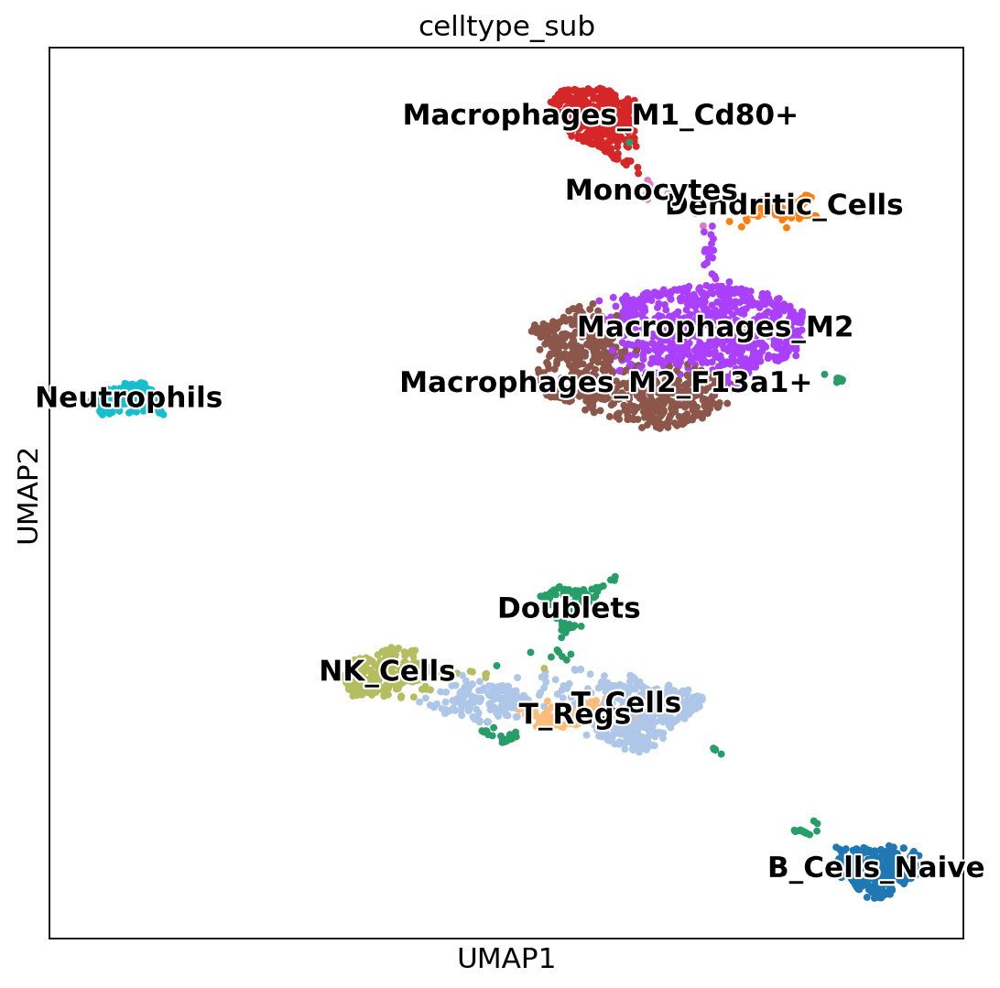

In [3]:
fig, ax = plt.subplots(figsize = (8,8))
sc.pl.umap(adata, color = ['celltype_sub'], ax = ax, legend_loc = 'on data', legend_fontsize=14, legend_fontoutline=2, size = 50)

... storing 'celltype_sub' as categorical


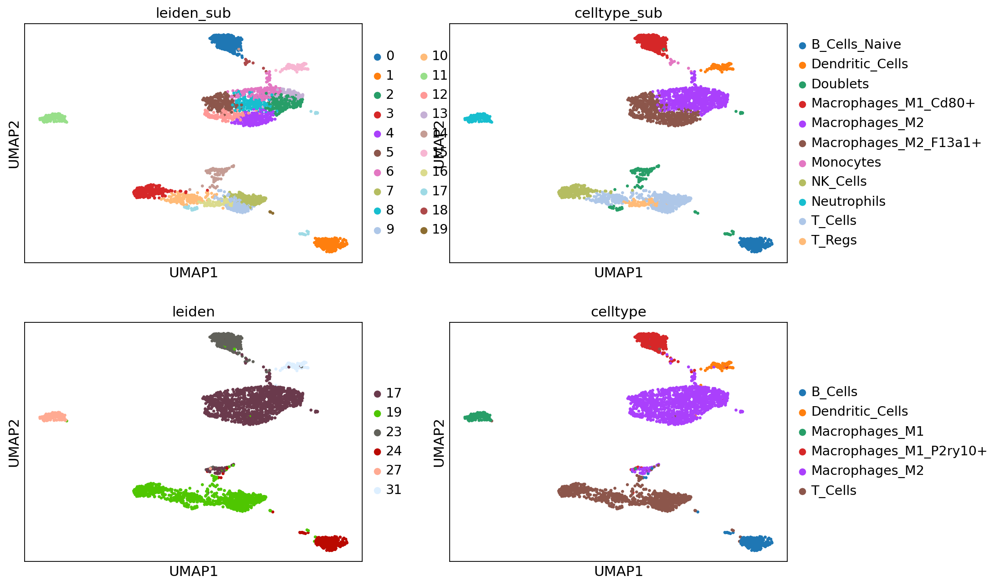

In [140]:
sc.pl.umap(adata, color = ['leiden_sub', 'celltype_sub', 'leiden', 'celltype'], ncols = 2)

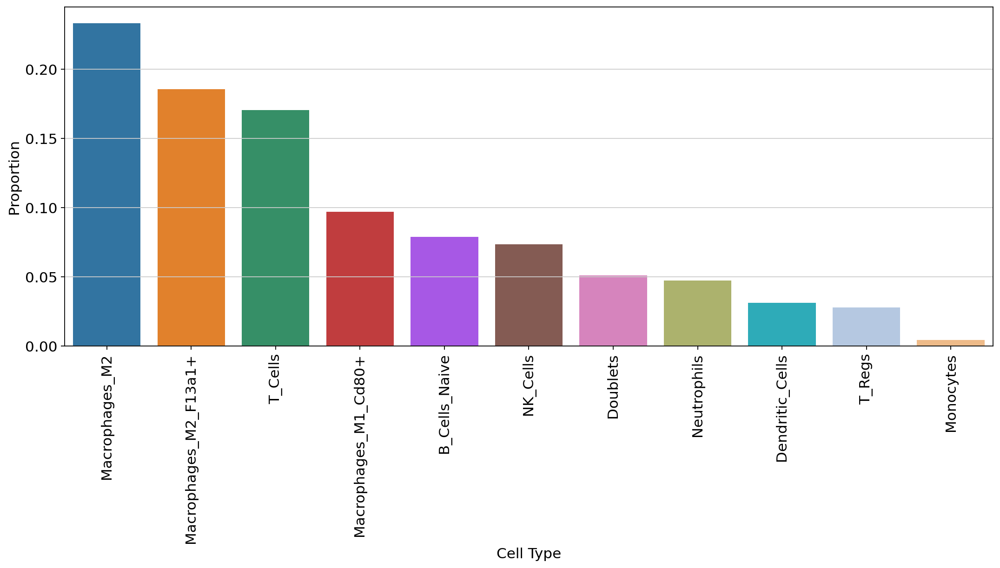

In [141]:
N = len(adata)
fig, ax = plt.subplots(figsize = (16,6))

props_dict = {"Cell Type":[], "Proportion":[]}
for i in np.unique(adata.obs.celltype_sub):
    i_len = len(adata[adata.obs.celltype_sub == i])
    props_dict["Cell Type"].append(i)
    props_dict["Proportion"].append(i_len/N)
props_df = pd.DataFrame(props_dict)

sns.barplot(x = "Cell Type", y = "Proportion", ax = ax, data = props_df, log = False, 
            order = props_df.sort_values("Proportion", ascending = False)["Cell Type"])
plt.xticks(rotation = 90)

#plt.savefig('../output/taPVAT_immune_cell_proportions_labeled.png', bbox_inches = "tight")
plt.show()

## Running rank_genes_groups to find DEGs by cell type

In [142]:
## Need to run this to get rank_genes_groups to work
adata.uns['log1p']["base"] = None

In [143]:
sc.tl.rank_genes_groups(adata, groupby = 'celltype_sub', method='wilcoxon', use_raw = True, tie_correct = True, pts = True)
sc.tl.dendrogram(adata, groupby = 'celltype_sub')

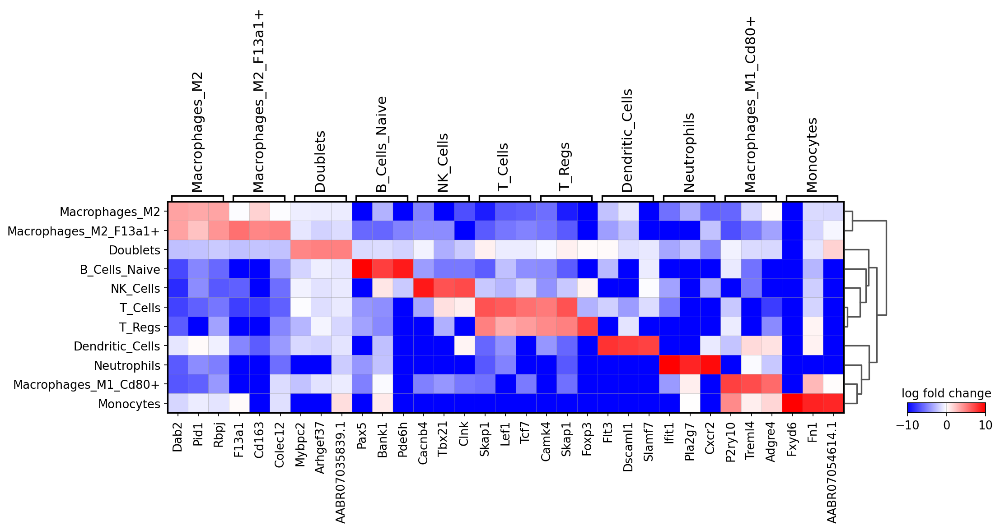

In [144]:
sc.pl.rank_genes_groups_matrixplot(
    adata,
    n_genes=3,
    values_to_plot="logfoldchanges",
    cmap='bwr',
    vmin=-10,
    vmax=10,
    min_logfoldchange=3,
    colorbar_title='log fold change'
)

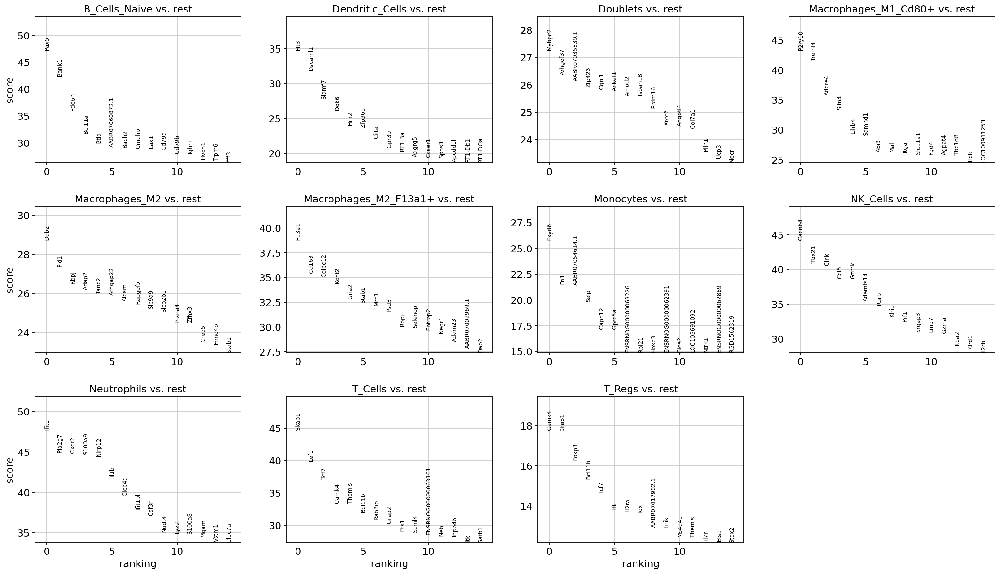

In [145]:
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(25)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(100).to_csv('../output/PVAT_Immune_Cells_8W_24W_HF_CTRL_M_F_rank_genes_groups_top_100_celltype_sub.csv')

## Visualizing the location of expression of common marker genes

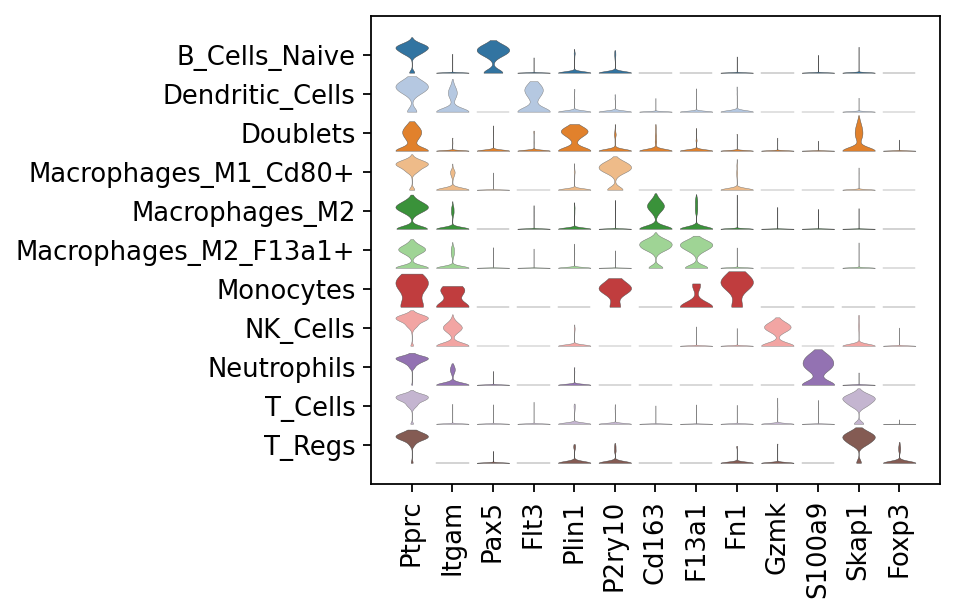

In [8]:
### Violin plot of gene expression for labeling "high-level" cell-types
mgl = ["Ptprc",  #Immune Cells
       "Itgam",  #Myeloid Cells
       "Pax5",   #B_Cells
       "Flt3",   #Dendritic Cells
       "Plin1",  #Doublets 
       "P2ry10", #Macrophages_M1
       "Cd163",  #Macrophages_M2
       "F13a1",  #Macrophages_M2_F13a1+
       "Fn1",    #Monocytes
       "Gzmk",   #NK_Cells
       "S100a9", #Neutrophils
       "Skap1",  #T_Cells
       "Foxp3"   #T_Regs
]

ax = sc.pl.stacked_violin(adata, 
                          mgl, 
                          use_raw = True,
                          groupby='celltype_sub', 
                          swap_axes = False, 
                          row_palette = 'tab20')

## Comparing our labels to labels used in other literature

In [116]:
def filter_genes_in_dict(adata, cell_type_genes_dict):
    """
    Filter genes in the cell_type_genes_dict that are not present in the adata object for each cell type.

    Parameters:
    adata (anndata.AnnData): The AnnData object containing gene expression data.
    cell_type_genes_dict (dict): A dictionary where keys are cell types and values are lists of genes.

    Returns:
    filtered_dict (dict): A filtered version of cell_type_genes_dict with only genes present in the adata.
    """
    filtered_dict = {}

    for cell_type, genes in cell_type_genes_dict.items():
        # Filter genes that are present in adata
        valid_genes = [gene for gene in genes if gene in adata.var_names]

        # Add the filtered genes to the dictionary
        filtered_dict[cell_type] = valid_genes

    return filtered_dict

In [125]:
# Load the tab-delimited file into a DataFrame
markers_mouse = pd.read_csv('../data/41586_2022_4518_MOESM5_ESM_ALL.txt', sep = '\t', index_col = 0)

# Initialize an empty dictionary
cluster_dict = {}

# Iterate through unique clusters and create a dictionary entry for each
for cluster in markers_mouse['cluster'].unique():
    # Filter the DataFrame for rows with the current cluster
    cluster_df = markers_mouse[markers_mouse['cluster'] == cluster]
    
    # Sort the cluster DataFrame by the "fold-change" column in descending order
    sorted_cluster_df = cluster_df.sort_values(by='avg_log2FC', ascending=False)
    
    # Extract the top 100 gene values for the cluster as a list
    top_genes = sorted_cluster_df['gene'].head(50).tolist()
    
    # Add the top 100 gene values list to the dictionary with the cluster as the key
    cluster_dict[cluster] = top_genes

filtered_markers = filter_genes_in_dict(adata, cluster_dict)

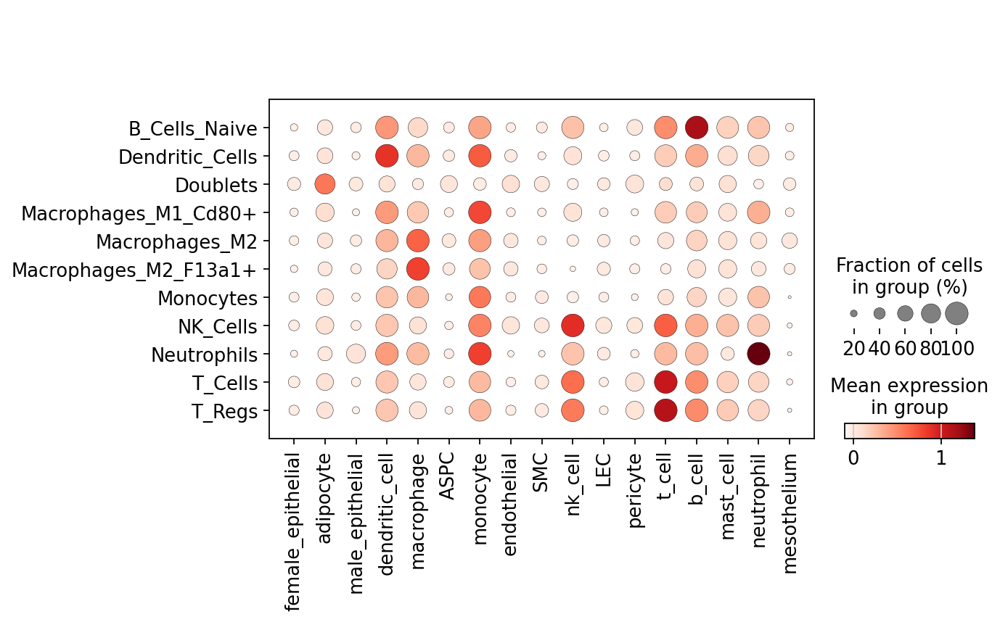

In [126]:
keys = filtered_markers.keys()

for key in keys:
    value = filtered_markers[key]
    sc.tl.score_genes(adata, value, ctrl_size=len(value), gene_pool=None, n_bins=50, score_name=key, use_raw=True)

sc.pl.dotplot(adata, list(keys), groupby='celltype_sub', dendrogram=False, save='_EmontMouseMarkers50_celltype_immune')

In [127]:
# Load the tab-delimited file into a DataFrame
markers_human = pd.read_csv('../data/41586_2022_4518_MOESM4_ESM_ALL.txt', sep = '\t', index_col = 0)

# Initialize an empty dictionary
cluster_dict = {}

# Iterate through unique clusters and create a dictionary entry for each
for cluster in markers_human['cluster'].unique():
    # Filter the DataFrame for rows with the current cluster
    cluster_df = markers_human[markers_human['cluster'] == cluster]
    
    # Sort the cluster DataFrame by the "fold-change" column in descending order
    sorted_cluster_df = cluster_df.sort_values(by='avg_log2FC', ascending=False)
    
    # Extract the top 100 gene values for the cluster as a list
    top_genes = sorted_cluster_df['gene'].head(50).tolist()
    
    # Add the top 100 gene values list to the dictionary with the cluster as the key
    cluster_dict[cluster] = [word.capitalize() for word in top_genes]

filtered_markers = filter_genes_in_dict(adata, cluster_dict)

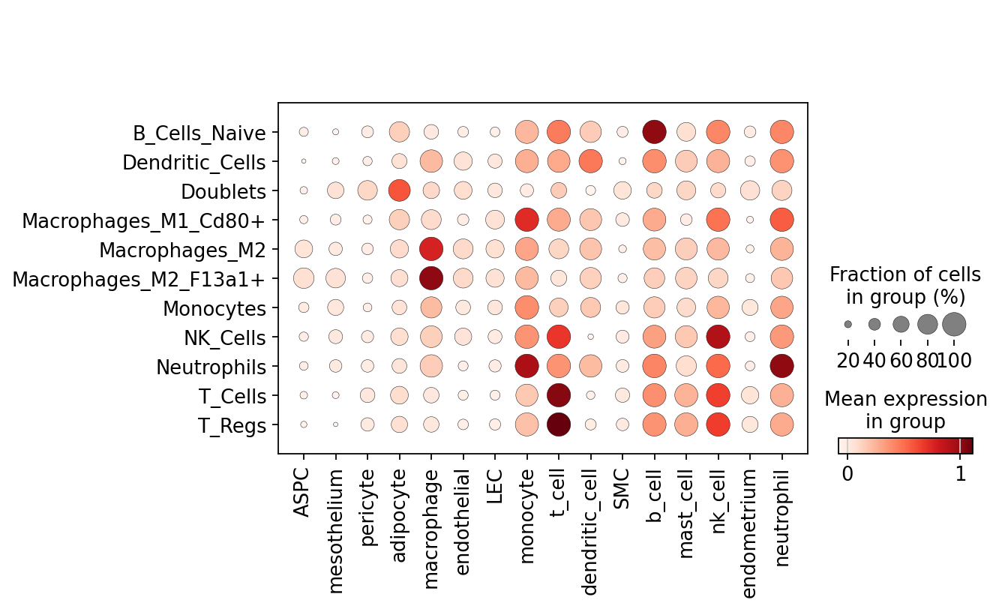

In [128]:
keys = filtered_markers.keys()

for key in keys:
    value = filtered_markers[key]
    sc.tl.score_genes(adata, value, ctrl_size=len(value), gene_pool=None, n_bins=50, score_name=key, use_raw=True)

sc.pl.dotplot(adata, list(keys), groupby='celltype_sub', dendrogram=False, save='_EmontHumanMarkers50_celltype_immune')

In [129]:
# Load the tab-delimited file into a DataFrame
markers_human_BAT = pd.read_csv('../data/Sun_markers_humanBAT.txt', sep = '\t', index_col = 0)

# Initialize an empty dictionary
cluster_dict = {}

# Iterate through unique clusters and create a dictionary entry for each
for cluster in markers_human_BAT['cluster'].unique():
    # Filter the DataFrame for rows with the current cluster
    cluster_df = markers_human_BAT[markers_human_BAT['cluster'] == cluster]
    
    # Sort the cluster DataFrame by the "fold-change" column in descending order
    sorted_cluster_df = cluster_df.sort_values(by='avg_logFC', ascending=False)
    
    # Extract the top 100 gene values for the cluster as a list
    top_genes = sorted_cluster_df['gene'].head(50).tolist()
    
    # Add the top 100 gene values list to the dictionary with the cluster as the key
    cluster_dict[cluster] = [word.capitalize() for word in top_genes]

filtered_markers = filter_genes_in_dict(adata, cluster_dict)

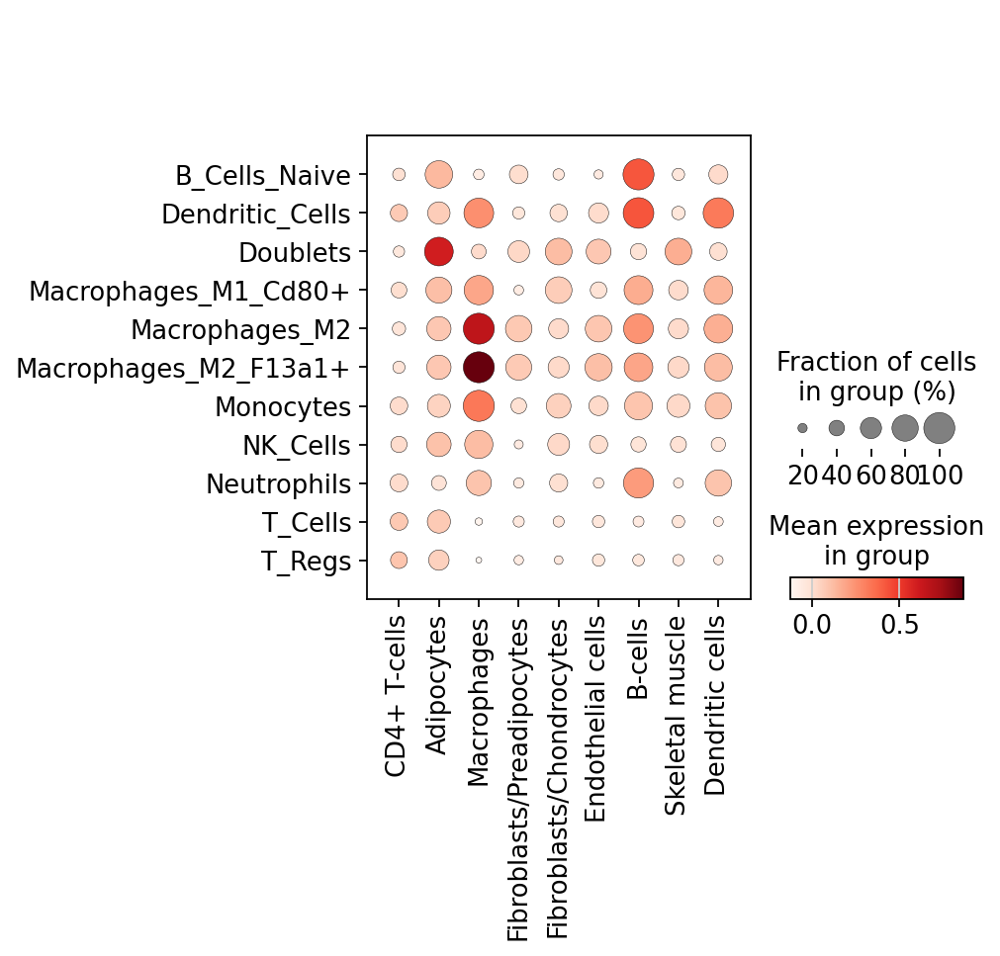

In [130]:
keys = filtered_markers.keys()

for key in keys:
    value = filtered_markers[key]
    sc.tl.score_genes(adata, value, ctrl_size=len(value), gene_pool=None, n_bins=50, score_name=key, use_raw=True)

sc.pl.dotplot(adata, list(keys), groupby='celltype_sub', dendrogram=False, save='_SunHumanMarkers50_celltype_immune')

## Clean up and save the subclustered and annotated data

In [131]:
### Simplifying the dataframe
filtered_columns = adata.obs.filter(regex=r'score$', axis=1)

# Drop the filtered columns from the original DataFrame
adata.obs.drop(columns=filtered_columns.columns, inplace=True)

In [134]:
adata.write_h5ad('../data/taPVAT_immune_cells_annotated.h5ad')

## Adding celltype_sub to original adata object

In [199]:
adata = sc.read_h5ad('../data/taPVAT_immune_cells_annotated.h5ad')

In [200]:
adata_sub = annotate.copy()

In [201]:
adata_sub.obs = pd.concat([adata_all.obs, adata.obs.celltype_sub], axis=1)
adata_sub.obs['celltype_sub'] = adata_sub.obs['celltype_sub'].astype('str')
adata_sub.obs['celltype'] = adata_sub.obs['celltype'].astype('str')
adata_sub.obs['celltype_sub'] = adata_sub.obs['celltype_sub'].fillna('replace')
adata_sub.obs['celltype_sub'] = adata_sub.obs['celltype_sub'].fillna(adata_sub.obs['celltype'])
adata_sub.obs['celltype_sub'] = adata_sub.obs.apply(lambda row: row['celltype'] if row['celltype_sub'] == 'nan' else row['celltype_sub'], axis=1)
adata_sub.obs['celltype'] = adata_sub.obs['celltype_sub'].copy().astype('category')
adata_sub

AnnData object with n_obs × n_vars = 71813 × 2000
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet', 'celltype', 'celltype_broad', 'leiden', 'Ptprc_score', 'celltype_sub'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', '

In [190]:
adata_sub.obs.celltype.value_counts()

Adipocytes_Brown         41222
ECs_1                     8916
Fibroblasts_Bmper+        4531
Adipocytes_3              3052
Pericytes                 2419
Fibroblasts_Pi16+         2153
Adipocytes_2              1793
Mesothelial_Cells         1546
ECs_Venous                1444
ECs_Lymph                 1101
Macrophages_M2             779
Macrophages_M2_F13a1+      620
T_Cells                    570
Macrophages_M1_Cd80+       324
B_Cells_Naive              264
NK_Cells                   246
SMCs                       185
Doublets                   170
Neutrophils                158
Neuronal_Cells             108
Dendritic_Cells            104
T_Regs                      93
Monocytes                   15
Name: celltype, dtype: int64

In [167]:
### Clean up the dataframe a bit
filtered_columns = ['pct_counts_in_top_20_genes',
                    'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt',
                    'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo',
                    'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier',
                    'mt_outlier', 'Ptprc_score', 'celltype_sub']

# Drop the filtered columns from the original DataFrame
adata_sub.obs.drop(columns=filtered_columns, inplace=True)
adata_sub.obs.columns

Index(['sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'n_genes', 'scDblFinder_score',
       'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch',
       'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W',
       'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W',
       'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet',
       'celltype', 'celltype_broad', 'leiden'],
      dtype='object')

In [168]:
adata_sub.write_h5ad('../data/taPVAT_combined_annotated_with_immune.h5ad')

... storing 'celltype' as categorical
